In [ ]:
# Transformers installation
! pip install transformers datasets
# To install from source instead of the last release, comment the command above and uncomment the following one.
# ! pip install git+https://github.com/huggingface/transformers.git

# Zero-shot object detection

Traditionally, models used for [object detection](https://huggingface.co/docs/transformers/main/en/tasks/object_detection) require labeled image datasets for training,
and are limited to detecting the set of classes from the training data.

Zero-shot object detection is supported by the [OWL-ViT](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/owlvit) model which uses a different approach. OWL-ViT
is an open-vocabulary object detector. It means that it can detect objects in images based on free-text queries without
the need to fine-tune the model on labeled datasets.

OWL-ViT leverages multi-modal representations to perform open-vocabulary detection. It combines [CLIP](https://huggingface.co/docs/transformers/main/en/tasks/../model_doc/clip) with
lightweight object classification and localization heads. Open-vocabulary detection is achieved by embedding free-text queries with the text encoder of CLIP and using them as input to the object classification and localization heads.
associate images and their corresponding textual descriptions, and ViT processes image patches as inputs. The authors
of OWL-ViT first trained CLIP from scratch and then fine-tuned OWL-ViT end to end on standard object detection datasets using
a bipartite matching loss.

With this approach, the model can detect objects based on textual descriptions without prior training on labeled datasets.

In this guide, you will learn how to use OWL-ViT:
- to detect objects based on text prompts
- for batch object detection
- for image-guided object detection

Before you begin, make sure you have all the necessary libraries installed:

```bash
pip install -q transformers
```

## Zero-shot object detection pipeline

The simplest way to try out inference with OWL-ViT is to use it in a [pipeline()](https://huggingface.co/docs/transformers/main/en/main_classes/pipelines#transformers.pipeline). Instantiate a pipeline
for zero-shot object detection from a [checkpoint on the Hugging Face Hub](https://huggingface.co/models?other=owlvit):

In [ ]:
from transformers import pipeline

checkpoint = "google/owlvit-base-patch32"
detector = pipeline(model=checkpoint, task="zero-shot-object-detection")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.42k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/613M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/392 [00:00<?, ?B/s]

Next, choose an image you'd like to detect objects in. Here we'll use the image of astronaut Eileen Collins that is
a part of the [NASA](https://www.nasa.gov/multimedia/imagegallery/index.html) Great Images dataset.

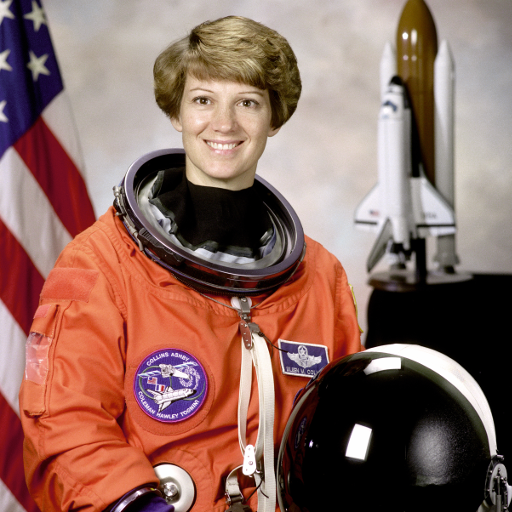

In [ ]:
import skimage
import numpy as np
from PIL import Image

image = skimage.data.astronaut()
image = Image.fromarray(np.uint8(image)).convert("RGB")

image

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_1.png" alt="Astronaut Eileen Collins"/>
</div>

Pass the image and the candidate object labels to look for to the pipeline.
Here we pass the image directly; other suitable options include a local path to an image or an image url. We also pass text descriptions for all items we want to query the image for.

In [ ]:
predictions = detector(
    image,
    candidate_labels=["human face", "rocket", "nasa badge", "star-spangled banner"],
)
predictions

[{'score': 0.357136070728302,
  'label': 'human face',
  'box': {'xmin': 180, 'ymin': 71, 'xmax': 271, 'ymax': 178}},
 {'score': 0.28099820017814636,
  'label': 'nasa badge',
  'box': {'xmin': 129, 'ymin': 348, 'xmax': 206, 'ymax': 427}},
 {'score': 0.2110229879617691,
  'label': 'rocket',
  'box': {'xmin': 350, 'ymin': -1, 'xmax': 468, 'ymax': 288}},
 {'score': 0.13790464401245117,
  'label': 'star-spangled banner',
  'box': {'xmin': 1, 'ymin': 1, 'xmax': 105, 'ymax': 509}},
 {'score': 0.11950172483921051,
  'label': 'nasa badge',
  'box': {'xmin': 277, 'ymin': 338, 'xmax': 327, 'ymax': 380}},
 {'score': 0.1064935252070427,
  'label': 'rocket',
  'box': {'xmin': 358, 'ymin': 64, 'xmax': 424, 'ymax': 280}}]

Let's visualize the predictions:

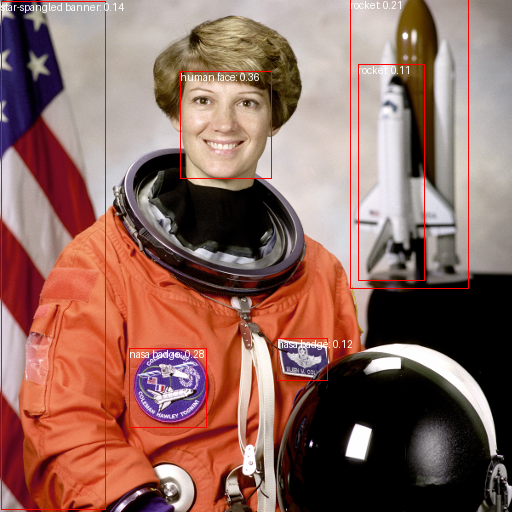

In [ ]:
from PIL import ImageDraw

draw = ImageDraw.Draw(image)

for prediction in predictions:
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

image

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_2.png" alt="Visualized predictions on NASA image"/>
</div>

## Text-prompted zero-shot object detection by hand

Now that you've seen how to use the zero-shot object detection pipeline, let's replicate the same
result manually.

Start by loading the model and associated processor from a [checkpoint on the Hugging Face Hub](https://huggingface.co/models?other=owlvit).
Here we'll use the same checkpoint as before:

In [ ]:
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

model = AutoModelForZeroShotObjectDetection.from_pretrained(checkpoint)
processor = AutoProcessor.from_pretrained(checkpoint)

Let's take a different image to switch things up.

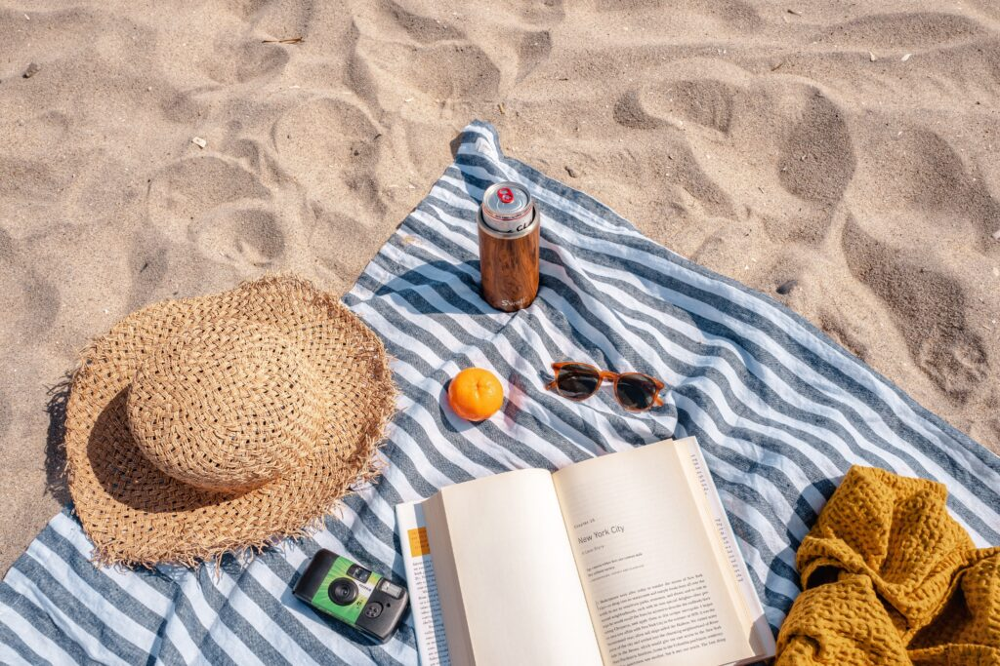

In [ ]:
import requests

url = "https://www.blakemichellemorgan.com/wp-content/uploads/2023/05/s-well-oj0zeY2Ltk4-unsplash-1024x683.jpg"
im = Image.open(requests.get(url, stream=True).raw)
im

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_3.png" alt="Beach photo"/>
</div>

Use the processor to prepare the inputs for the model. The processor combines an image processor that prepares the
image for the model by resizing and normalizing it, and a [CLIPTokenizer](https://huggingface.co/docs/transformers/main/en/model_doc/clip#transformers.CLIPTokenizer) that takes care of the text inputs.

In [ ]:
text_queries = ["hat", "book", "sunglasses", "camera"]
inputs = processor(text=text_queries, images=im, return_tensors="pt")

Pass the inputs through the model, post-process, and visualize the results. Since the image processor resized images before
feeding them to the model, you need to use the [post_process_object_detection()](https://huggingface.co/docs/transformers/main/en/model_doc/owlvit#transformers.OwlViTImageProcessor.post_process_object_detection) method to make sure the predicted bounding
boxes have the correct coordinates relative to the original image:

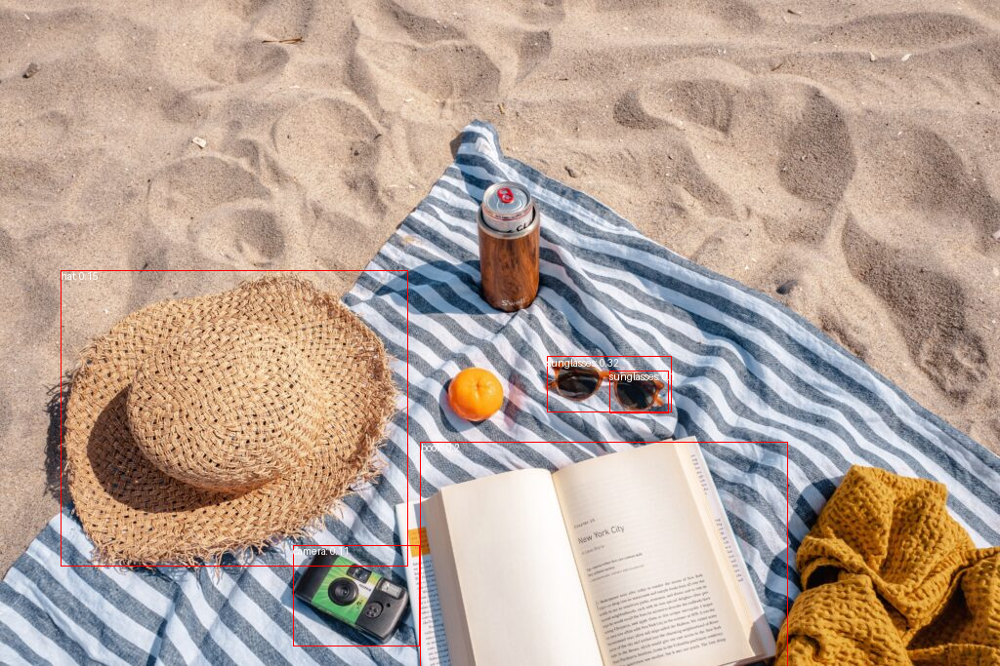

In [ ]:
import torch

with torch.no_grad():
    outputs = model(**inputs)
    target_sizes = torch.tensor([im.size[::-1]])
    results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]

draw = ImageDraw.Draw(im)

scores = results["scores"].tolist()
labels = results["labels"].tolist()
boxes = results["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{text_queries[label]}: {round(score,2)}", fill="white")

im

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_4.png" alt="Beach photo with detected objects"/>
</div>

## Batch processing

You can pass multiple sets of images and text queries to search for different (or same) objects in several images.
Let's use both an astronaut image and the beach image together.
For batch processing, you should pass text queries as a nested list to the processor and images as lists of PIL images,
PyTorch tensors, or NumPy arrays.

In [ ]:
images = [image, im]
text_queries = [
    ["human face", "rocket", "nasa badge", "star-spangled banner"],
    ["hat", "book", "sunglasses", "camera"],
]
inputs = processor(text=text_queries, images=images, return_tensors="pt")

Previously for post-processing you passed the single image's size as a tensor, but you can also pass a tuple, or, in case
of several images, a list of tuples. Let's create predictions for the two examples, and visualize the second one (`image_idx = 1`).

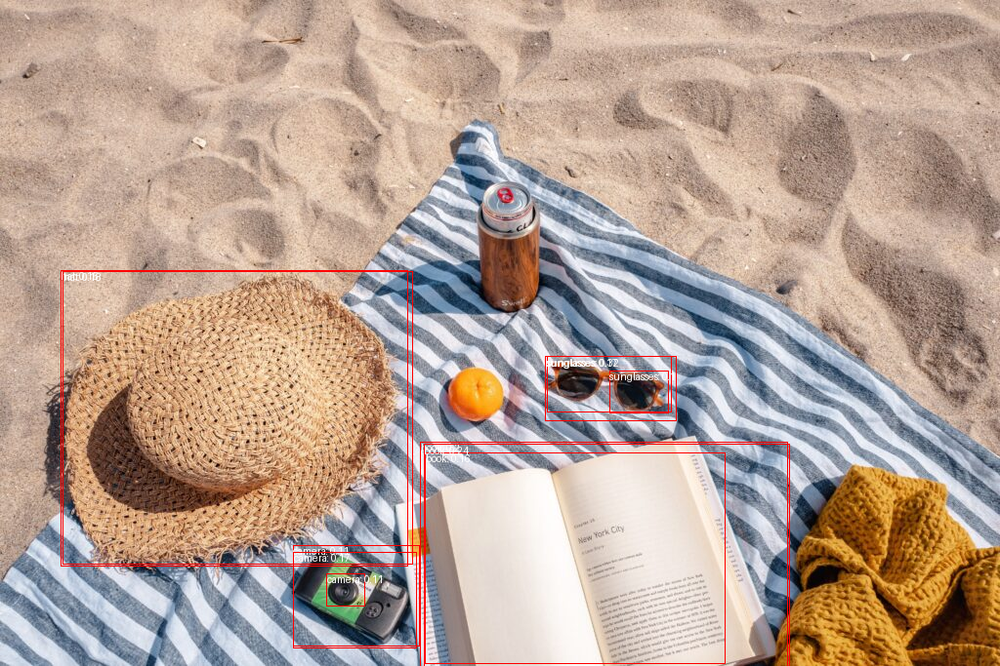

In [ ]:
with torch.no_grad():
    outputs = model(**inputs)
    target_sizes = [x.size[::-1] for x in images]
    results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)

image_idx = 1
draw = ImageDraw.Draw(images[image_idx])

scores = results[image_idx]["scores"].tolist()
labels = results[image_idx]["labels"].tolist()
boxes = results[image_idx]["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{text_queries[image_idx][label]}: {round(score,2)}", fill="white")

images[image_idx]

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_4.png" alt="Beach photo with detected objects"/>
</div>

## Image-guided object detection

In addition to zero-shot object detection with text queries, OWL-ViT offers image-guided object detection. This means
you can use an image query to find similar objects in the target image.
Unlike text queries, only a single example image is allowed.

Let's take an image with two cats on a couch as a target image, and an image of a single cat
as a query:

In [ ]:
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image_target = Image.open(requests.get(url, stream=True).raw)

query_url = "http://images.cocodataset.org/val2017/000000524280.jpg"
query_image = Image.open(requests.get(query_url, stream=True).raw)

Let's take a quick look at the images:

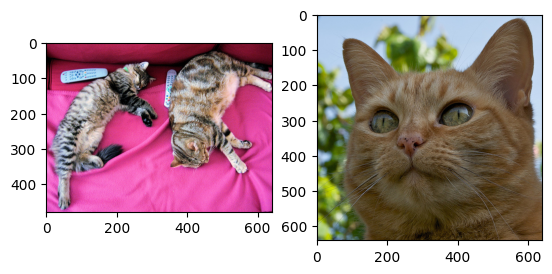

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2)
ax[0].imshow(image_target)
ax[1].imshow(query_image)

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_5.png" alt="Cats"/>
</div>

In the preprocessing step, instead of text queries, you now need to use `query_images`:

In [ ]:
inputs = processor(images=image_target, query_images=query_image, return_tensors="pt")

For predictions, instead of passing the inputs to the model, pass them to [image_guided_detection()](https://huggingface.co/docs/transformers/main/en/model_doc/owlvit#transformers.OwlViTForObjectDetection.image_guided_detection). Draw the predictions
as before except now there are no labels.

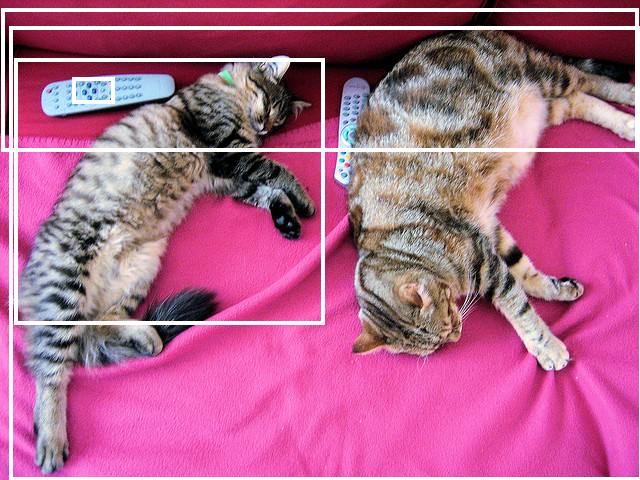

In [ ]:
with torch.no_grad():
    outputs = model.image_guided_detection(**inputs)
    target_sizes = torch.tensor([image_target.size[::-1]])
    results = processor.post_process_image_guided_detection(outputs=outputs, target_sizes=target_sizes)[0]

draw = ImageDraw.Draw(image_target)

scores = results["scores"].tolist()
boxes = results["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="white", width=4)

image_target

<div class="flex justify-center">
     <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/zero-sh-obj-detection_6.png" alt="Cats with bounding boxes"/>
</div>

If you'd like to interactively try out inference with OWL-ViT, check out this demo:

<iframe
	src="https://adirik-owl-vit.hf.space"
	frameborder="0"
	width="850"
	height="450"
></iframe>

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 13.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


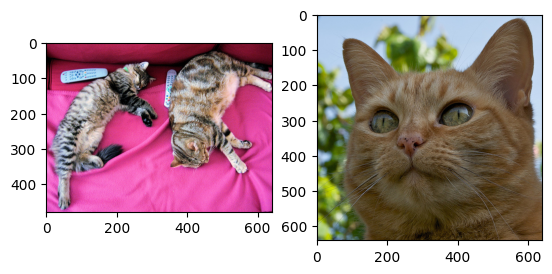

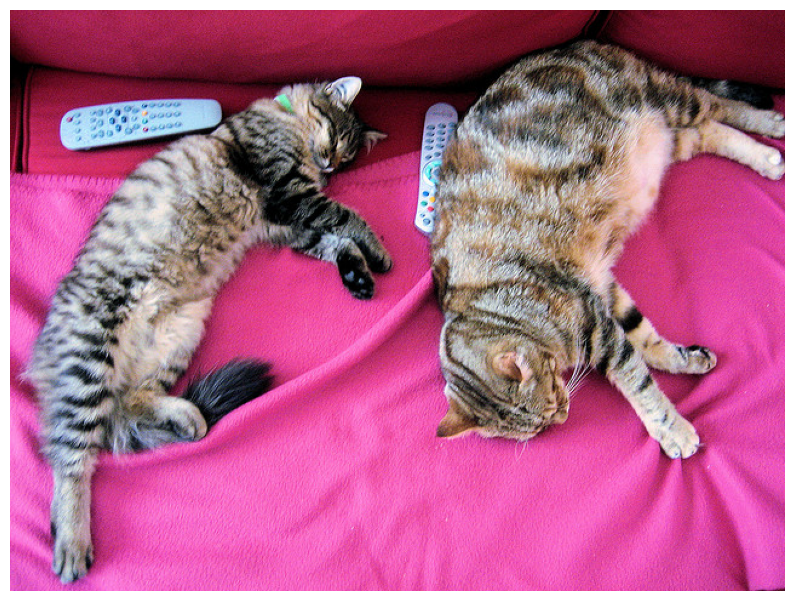

Detected Objects:


In [ ]:
# Install necessary libraries
!pip install transformers datasets torch torchvision pillow matplotlib

from transformers import pipeline, AutoProcessor, AutoModelForZeroShotObjectDetection
from PIL import Image, ImageDraw
import requests
import matplotlib.pyplot as plt
import torch

# Load the model and processor
checkpoint = "google/owlvit-base-patch32"
model = AutoModelForZeroShotObjectDetection.from_pretrained(checkpoint)
processor = AutoProcessor.from_pretrained(checkpoint)
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image_target = Image.open(requests.get(url, stream=True).raw)

query_url = "http://images.cocodataset.org/val2017/000000524280.jpg"
query_image = Image.open(requests.get(query_url, stream=True).raw)
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2)
ax[0].imshow(image_target)
ax[1].imshow(query_image)

# Define the image URL
url = "http://images.cocodataset.org/val2017/000000039769.jpg"

# Load the image
try:
    response = requests.get(url, stream=True)
    response.raise_for_status()
    if "image" not in response.headers["Content-Type"]:
        raise ValueError("URL does not point to an image file.")
    image = Image.open(response.raw).convert("RGB")
except Exception as e:
    print(f"Error loading image: {e}")
    image = None

if image:
    # Define the labels to detect
    candidate_labels = ["person", "bicycle", "car", "dog"]

    # Prepare the inputs
    inputs = processor(text=candidate_labels, images=image, return_tensors="pt")

    # Perform inference
    with torch.no_grad():
        outputs = model(**inputs)
        target_sizes = torch.tensor([image.size[::-1]])  # (Height, Width)
        results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]

    # Draw bounding boxes and labels on the image
    draw = ImageDraw.Draw(image)
    for box, score, label in zip(results["boxes"], results["scores"], results["labels"]):
        xmin, ymin, xmax, ymax = box.tolist()
        label_text = f"{candidate_labels[label]}: {score:.2f}"
        draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
        draw.text((xmin, ymin), label_text, fill="white")

    # Display the annotated image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis("off")
    plt.show()

    # Print detected objects
    print("Detected Objects:")
    for label, score in zip(results["labels"], results["scores"]):
        print(f"- {candidate_labels[label]}: {score:.2f}")
else:
    print("No valid image to process.")


In [ ]:
# Install necessary libraries
!pip install transformers datasets pillow torch torchvision matplotlib

from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from PIL import Image, ImageDraw
import requests
import torch
import matplotlib.pyplot as plt

# Model and processor checkpoint
checkpoint = "google/owlvit-base-patch32"
model = AutoModelForZeroShotObjectDetection.from_pretrained(checkpoint)
processor = AutoProcessor.from_pretrained(checkpoint)
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image_target = Image.open(requests.get(url, stream=True).raw)

query_url = "http://images.cocodataset.org/val2017/000000524280.jpg"
query_image = Image.open(requests.get(query_url, stream=True).raw)
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2)
ax[0].imshow(image_target)
ax[1].imshow(query_image)

# Define the detector function
def detect_objects(image_url, object_names):
    """
    Detects objects in an image based on the provided object names.

    Parameters:
    - image_url (str): URL of the image to analyze.
    - object_names (list): List of object names to detect.

    Returns:
    - Annotated image and list of detected objects with their confidence scores.
    """
    try:
        # Fetch the image content
        response = requests.get(image_url, stream=True)
        response.raise_for_status()  # Check if the request was successful

        # Validate if the response contains an image
        if "image" not in response.headers.get("Content-Type", ""):
            raise ValueError(f"The URL does not point to an image. Content-Type: {response.headers.get('Content-Type')}")

        # Open the image
        image = Image.open(response.raw).convert("RGB")
    except Exception as e:
        print(f"Error loading the image: {e}")
        return None, []

    # Process the image and text queries
    inputs = processor(text=object_names, images=image, return_tensors="pt")

    # Perform inference
    with torch.no_grad():
        outputs = model(**inputs)
        target_sizes = torch.tensor([image.size[::-1]])  # Width, Height
        results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]

    # Annotate the image
    draw = ImageDraw.Draw(image)
    detected_objects = []
    scores = results["scores"].tolist()
    labels = results["labels"].tolist()
    boxes = results["boxes"].tolist()

    for box, score, label in zip(boxes, scores, labels):
        xmin, ymin, xmax, ymax = box
        detected_objects.append((object_names[label], round(score, 2)))
        draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=2)
        draw.text((xmin, ymin), f"{object_names[label]}: {round(score, 2)}", fill="white")

    return image, detected_objects

# Example usage with a working URL
image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"  # Replace with your URL if needed
object_names = ["person", "bicycle", "car"]

# Detect objects and annotate the image
annotated_image, detected_objects = detect_objects(image_url, object_names)

# Display the result and print detected objects
if annotated_image:
    # Use Matplotlib to display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()

    # Print detected objects
    print("Detected Objects:")
    for obj_name, score in detected_objects:
        print(f"- {obj_name}: {score}")
else:
    print("No image was processed due to errors.")
inputs = processor(images=image_target, query_images=query_image, return_tensors="pt")
with torch.no_grad():
    outputs = model.image_guided_detection(**inputs)
    target_sizes = torch.tensor([image_target.size[::-1]])
    results = processor.post_process_image_guided_detection(outputs=outputs, target_sizes=target_sizes)[0]

draw = ImageDraw.Draw(image_target)

scores = results["scores"].tolist()
boxes = results["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="white", width=4)

image_target


Output hidden; open in https://colab.research.google.com to view.

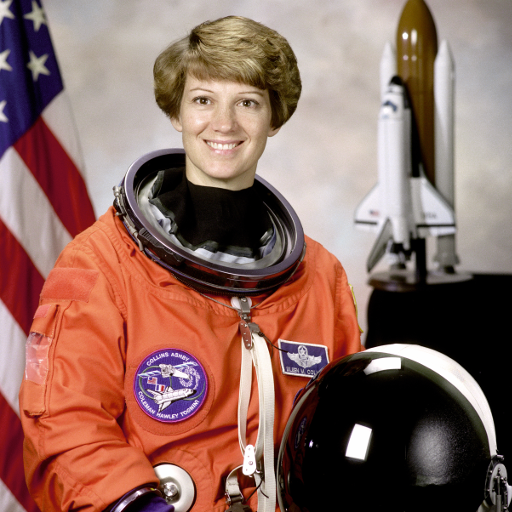

In [ ]:
import skimage
import numpy as np
from PIL import Image

image = skimage.data.astronaut()
image = Image.fromarray(np.uint8(image)).convert("RGB")

image

In [ ]:
predictions = detector(
    image,
    candidate_labels=["human face", "rocket", "nasa badge", "star-spangled banner"],
)
predictions

[{'score': 0.357136070728302,
  'label': 'human face',
  'box': {'xmin': 180, 'ymin': 71, 'xmax': 271, 'ymax': 178}},
 {'score': 0.28099820017814636,
  'label': 'nasa badge',
  'box': {'xmin': 129, 'ymin': 348, 'xmax': 206, 'ymax': 427}},
 {'score': 0.2110229879617691,
  'label': 'rocket',
  'box': {'xmin': 350, 'ymin': -1, 'xmax': 468, 'ymax': 288}},
 {'score': 0.13790464401245117,
  'label': 'star-spangled banner',
  'box': {'xmin': 1, 'ymin': 1, 'xmax': 105, 'ymax': 509}},
 {'score': 0.11950172483921051,
  'label': 'nasa badge',
  'box': {'xmin': 277, 'ymin': 338, 'xmax': 327, 'ymax': 380}},
 {'score': 0.1064935252070427,
  'label': 'rocket',
  'box': {'xmin': 358, 'ymin': 64, 'xmax': 424, 'ymax': 280}}]

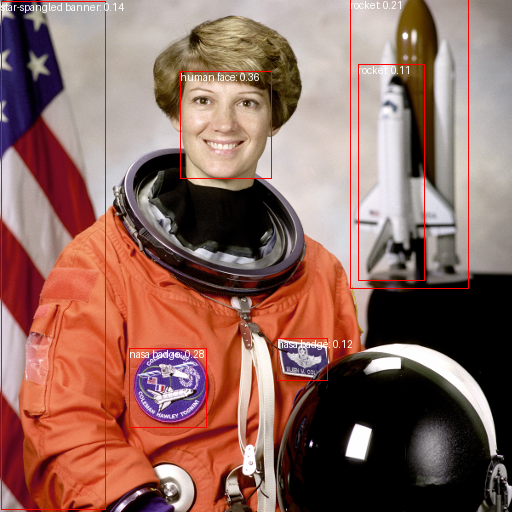

In [ ]:
from PIL import ImageDraw

draw = ImageDraw.Draw(image)

for prediction in predictions:
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

image

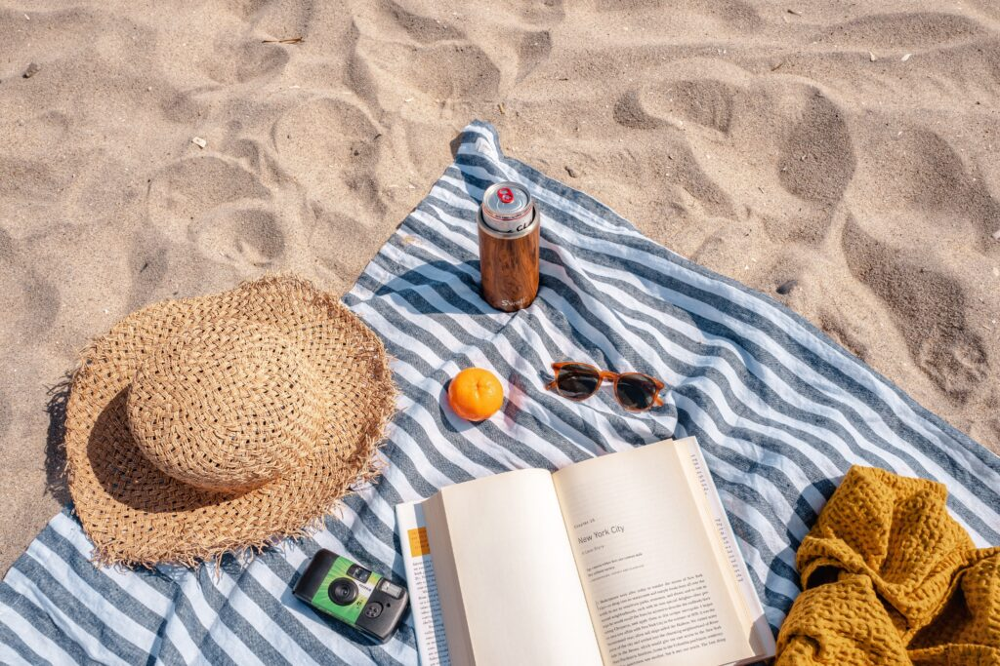

In [ ]:
import requests

url = "https://www.blakemichellemorgan.com/wp-content/uploads/2023/05/s-well-oj0zeY2Ltk4-unsplash-1024x683.jpg"
im = Image.open(requests.get(url, stream=True).raw)
im

In [ ]:
text_queries = ["hat", "book", "sunglasses", "camera"]
inputs = processor(text=text_queries, images=im, return_tensors="pt")

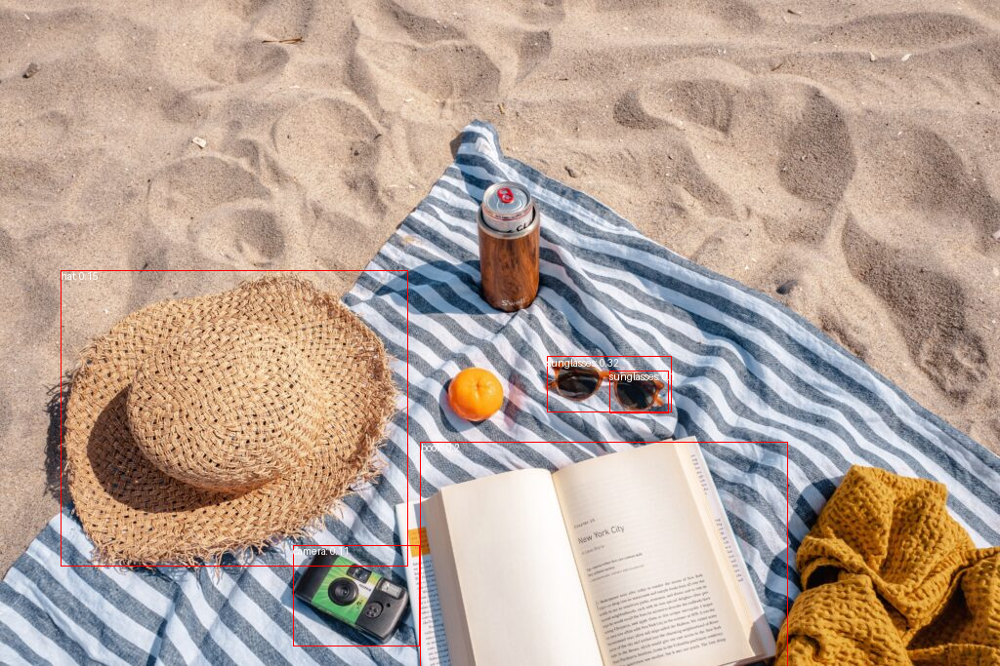

In [ ]:
import torch

with torch.no_grad():
    outputs = model(**inputs)
    target_sizes = torch.tensor([im.size[::-1]])
    results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]

draw = ImageDraw.Draw(im)

scores = results["scores"].tolist()
labels = results["labels"].tolist()
boxes = results["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{text_queries[label]}: {round(score,2)}", fill="white")

im

In [ ]:
images = [image, im]
text_queries = [
    ["human face", "rocket", "nasa badge", "star-spangled banner"],
    ["hat", "book", "sunglasses", "camera"],
]
inputs = processor(text=text_queries, images=images, return_tensors="pt")

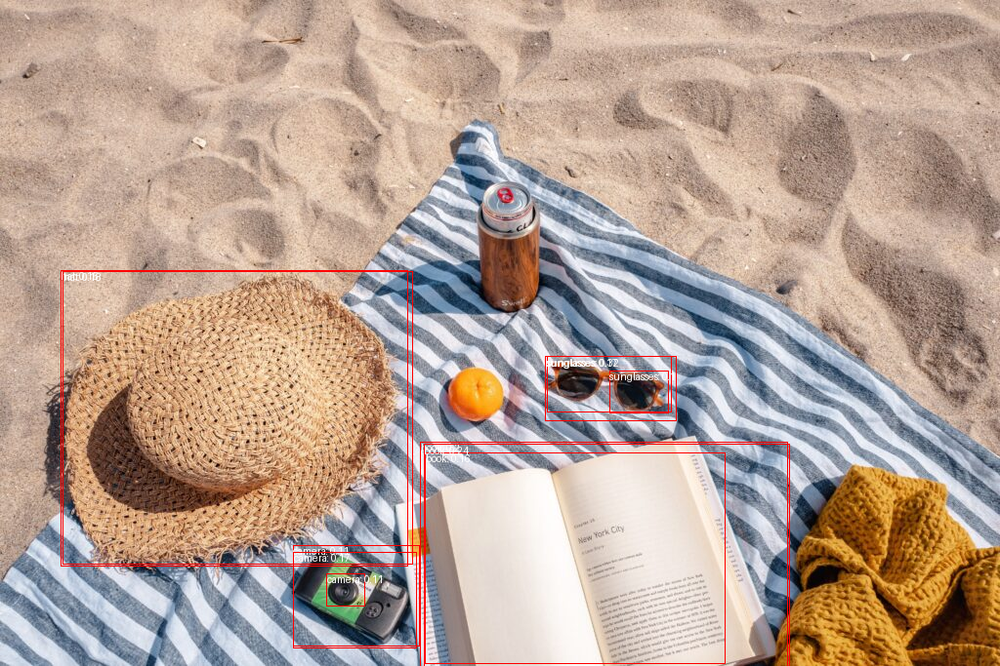

In [ ]:
with torch.no_grad():
    outputs = model(**inputs)
    target_sizes = [x.size[::-1] for x in images]
    results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)

image_idx = 1
draw = ImageDraw.Draw(images[image_idx])

scores = results[image_idx]["scores"].tolist()
labels = results[image_idx]["labels"].tolist()
boxes = results[image_idx]["boxes"].tolist()

for box, score, label in zip(boxes, scores, labels):
    xmin, ymin, xmax, ymax = box
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{text_queries[image_idx][label]}: {round(score,2)}", fill="white")

images[image_idx]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.42k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/613M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/392 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

input_ids: torch.Size([6, 16])
attention_mask: torch.Size([6, 16])
pixel_values: torch.Size([2, 3, 768, 768])
logits: shape of torch.Size([2, 576, 3])
pred_boxes: shape of torch.Size([2, 576, 4])
text_embeds: shape of torch.Size([2, 3, 512])
image_embeds: shape of torch.Size([2, 24, 24, 768])
class_embeds: shape of torch.Size([2, 576, 512])

Text model outputs
last_hidden_state: shape of torch.Size([6, 16, 512])
pooler_output: shape of torch.Size([6, 512])

Vision model outputs
last_hidden_state: shape of torch.Size([2, 577, 768])
pooler_output: shape of torch.Size([2, 768])


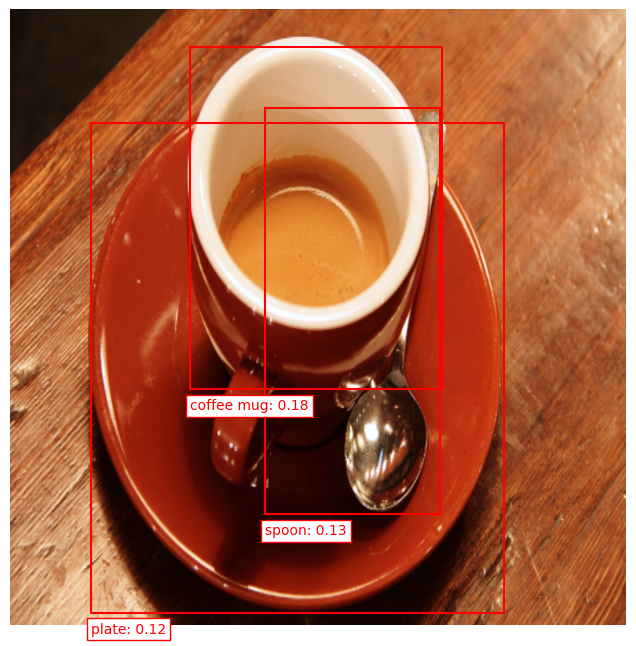

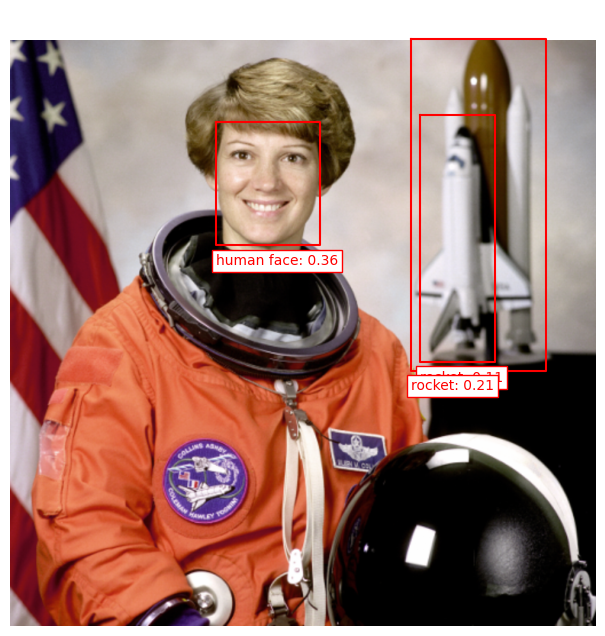

In [1]:
"""
# zero-shot text-conditioned object detection model using OWL-ViT (open-vocabulary object detection network)
    # utilizes multiple text-based queries/prompts to search for and detect target objects in one or multiple images.
    # The goal is to detect novel classes defined by an unbounded (open) vocabulary at inference.
    # uses CLIP with a ViT-like Transformer as its backbone to get multi-modal visual and text features.
"""

# Set-up environment
# !pip install -q git+https://github.com/huggingface/transformers.git

# optional: Install Pillow, matplotlib and OpenCV if you are running this script locally."""
# !pip install Pillow
# !pip install matplotlib
# !pip install opencv-python

import os
import cv2
import skimage
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from transformers.image_utils import ImageFeatureExtractionMixin
from transformers import OwlViTProcessor, OwlViTForObjectDetection

#%% helper function (s)

def plot_predictions(input_image, text_queries, scores, boxes, labels):

    """
    draws boundary boxes, text queries, and predicted probabiities on top of the input image(s)
    """
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(input_image, extent=(0, 1, 1, 0))
    ax.set_axis_off()

    for score, box, label in zip(scores, boxes, labels):

      if score < score_threshold:
        continue

      cx, cy, w, h = box
      ax.plot([cx-w/2, cx+w/2, cx+w/2, cx-w/2, cx-w/2],
              [cy-h/2, cy-h/2, cy+h/2, cy+h/2, cy-h/2], "r")
      ax.text(
          cx - w / 2,
          cy + h / 2 + 0.015,
          f"{text_queries[label]}: {score:1.2f}",
          ha="left",
          va="top",
          color="red",
          bbox={
              "facecolor": "white",
              "edgecolor": "red",
              "boxstyle": "square,pad=.3"
          })

#%% settings

# Use GPU if available
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

mixin = ImageFeatureExtractionMixin()

#%% Load pre-trained model (OwlViTForObjectDetection)

# model outputs:
    # - the prediction logits,
    # - boundary boxes and class embeddings,
    # - along with the image and text embeddings outputted by the `OwlViTModel`, which is the CLIP backbone.

model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

# Set model in evaluation mode
model = model.to(device)
model.eval()

#%% load image processor

# The processor will resize the image(s), scale it between [0-1] range and normalize it
    # across the channels using the mean and standard deviation specified in the original codebase.

# Text queries are tokenized using a CLIP tokenizer and stacked to output tensors of the following shape:
    # [batch_size * num_max_text_queries, sequence_length].
# If you are inputting more than one set of (image, text prompt/s),
    # num_max_text_queries -> maximum number of text queries per image across the batch.
    # Input samples with fewer text queries are padded.

processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")

#%% pass in multiple sets of images and text queries (corresponding to the same or different objects) to search for in different images.

    # input text queries as a nested list to `OwlViTProcessor`
    # and images as lists of (PIL images or PyTorch tensors or NumPy arrays).

# Preprocessing
images = [skimage.data.coffee(), skimage.data.astronaut()]
images = [Image.fromarray(np.uint8(img)).convert("RGB") for img in images]

# Nested list of text queries
# text_queries = [["coffee mug", "spoon", "plate"], ["human face", "rocket", "nasa badge", "star-spangled banner"]]
text_queries = [["coffee mug", "spoon", "plate"], ["human face", "rocket"]]

# Process image and text inputs
inputs = processor(text=text_queries, images=images, return_tensors="pt").to(device)

# Print input names and shapes
# Notice the size of the `input_ids `and `attention_mask` is `[batch_size * num_max_text_queries, max_length]`.
    # Max_length is set to 16 for all OWL-ViT models.
for key, val in inputs.items():
    print(f"{key}: {val.shape}")

#%% Get prediction

with torch.no_grad():
  outputs = model(**inputs)

for k, val in outputs.items():
    if k not in {"text_model_output", "vision_model_output"}:
        print(f"{k}: shape of {val.shape}")

print("\nText model outputs")
for k, val in outputs.text_model_output.items():
    print(f"{k}: shape of {val.shape}")

print("\nVision model outputs")
for k, val in outputs.vision_model_output.items():
    print(f"{k}: shape of {val.shape}")

#%% plot the predictions for all images

for image_idx in range(len(images)):

    image_size = model.config.vision_config.image_size
    image = mixin.resize(images[image_idx], image_size)
    input_image = np.asarray(image).astype(np.float32) / 255.0

    # Threshold to eliminate low probability predictions
    score_threshold = 0.1

    # Get prediction logits
    logits = torch.max(outputs["logits"][image_idx], dim=-1)
    scores = torch.sigmoid(logits.values).cpu().detach().numpy()

    # Get prediction labels and boundary boxes
    labels = logits.indices.cpu().detach().numpy()
    boxes = outputs["pred_boxes"][image_idx].cpu().detach().numpy()

    plot_predictions(input_image, text_queries[image_idx], scores, boxes, labels)

In [3]:
pip install gradio

In [4]:
import gradio as gr
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from PIL import Image, ImageDraw
import torch

# Load model and processor
checkpoint = "google/owlvit-base-patch32"
model = AutoModelForZeroShotObjectDetection.from_pretrained(checkpoint)
processor = AutoProcessor.from_pretrained(checkpoint)

# Function for object detection
def detect_objects(image, object_labels):
    object_names = [label.strip() for label in object_labels.split(",")]  # Convert labels to a list
    inputs = processor(text=object_names, images=image, return_tensors="pt")

    # Perform inference
    with torch.no_grad():
        outputs = model(**inputs)
        target_sizes = torch.tensor([image.size[::-1]])
        results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]

    # Annotate image
    draw = ImageDraw.Draw(image)
    for box, score, label in zip(results["boxes"], results["scores"], results["labels"]):
        xmin, ymin, xmax, ymax = box.tolist()
        label_text = f"{object_names[label]}: {score:.2f}"
        draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
        draw.text((xmin, ymin), label_text, fill="white")

    return image

# Define Gradio interface
image_input = gr.Image(type="pil", label="Upload an Image")
text_input = gr.Textbox(lines=2, placeholder="Enter object labels, separated by commas", label="Object Labels")
image_output = gr.Image(type="pil", label="Annotated Image")

gr.Interface(
    fn=detect_objects,
    inputs=[image_input, text_input],
    outputs=image_output,
    title="Zero-Shot Object Detection",
    description="Upload an image and provide object labels (e.g., 'person, car, dog') to detect them in the image."
).launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b9f3d7f48e0e01659f.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
